# Machine Learning - Nonlinear Theory and Applications

In the context of BCIs, machine learning plays a crucial role in decoding neural signals into meaningful actions. The relationship between brain activity and behavior is inherently non-linear and varies from individual to individual. For instance, the brain’s response to movement is complex, requiring models that can handle non-linear patterns in the data.

In this workshop, we will explore how non-linear machine learning techniques, particularly neural networks, can be applied to BCI systems to make sense of the data captured from the brain. By building and experimenting with non-linear classification and regression models, we aim to deepen our understanding of how machine learning helps bridge the gap between neural signals and actionable insights in BCIs.

## Part 1: Understanding Non-linear Classification

In the real world, many classification problems are non-linear, meaning that the boundary separating different classes is not a straight line or plane. A neural network is an effective tool for solving these types of problems because it can learn highly complex, non-linear relationships between the input features and the target labels.

In this section, we will create a synthetic dataset where two classes are separated by a circular boundary. This type of classification problem cannot be solved with a simple linear model. First, we'll visualize the original data to see why a linear decision boundary would fail. Then, we'll explore how transforming the data into higher-dimensional space can make it easier to classify with linear methods. Finally, we'll build a neural network to classify this non-linear data.

### Generating the Non-linearly Separable Dataset

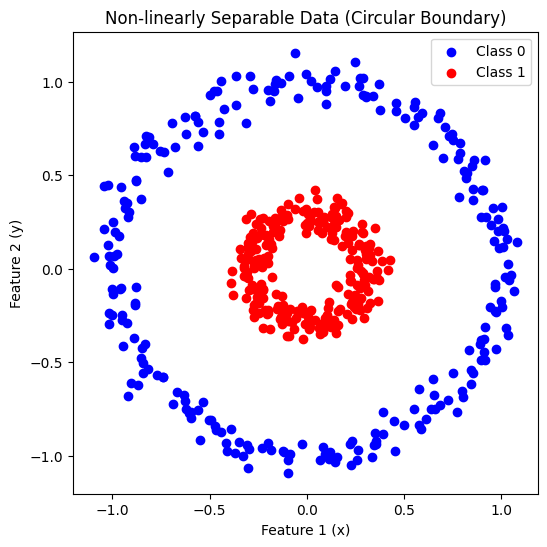

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_circles
from mpl_toolkits.mplot3d import Axes3D
from keras.models import Sequential
from keras.layers import Dense, Input

# Generate a synthetic 2-class dataset where classes are circularly separated
X, y = make_circles(n_samples=500, factor=0.3, noise=0.05, random_state=42)

# Plot the original 2D dataset
plt.figure(figsize=(6, 6))
plt.scatter(X[y == 0][:, 0], X[y == 0][:, 1], color='blue', label="Class 0")
plt.scatter(X[y == 1][:, 0], X[y == 1][:, 1], color='red', label="Class 1")
plt.title("Non-linearly Separable Data (Circular Boundary)")
plt.xlabel("Feature 1 (x)")
plt.ylabel("Feature 2 (y)")
plt.legend()
plt.show()




### Transforming the Data into Higher Dimensions

One common way to deal with non-linearly separable data is to transform it into a higher-dimensional space. Here, we create a new feature space consisting of $x^2$, $y^2$, and $xy$. This transformation will make the data linearly separable in the new space.

We'll visualize the data in this transformed space using a 3D plot.

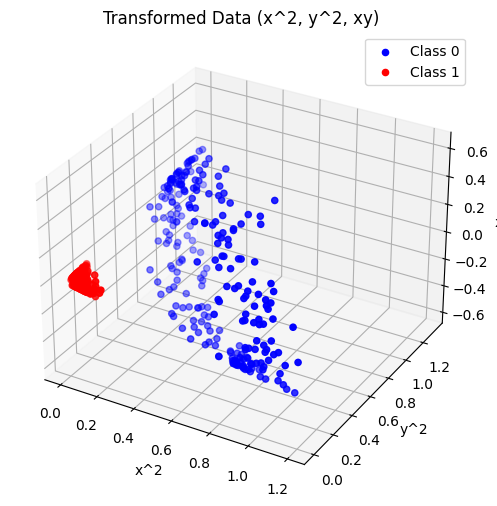

In [ ]:
# Now, transform the data to higher-dimensional space (x^2, y^2, xy)
X_transformed = np.c_[X[:, 0]**2, X[:, 1]**2, X[:, 0] * X[:, 1]]

# Plot the transformed dataset in 3D space
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_transformed[y == 0][:, 0], X_transformed[y == 0][:, 1], X_transformed[y == 0][:, 2], color='blue', label="Class 0")
ax.scatter(X_transformed[y == 1][:, 0], X_transformed[y == 1][:, 1], X_transformed[y == 1][:, 2], color='red', label="Class 1")
ax.set_title("Transformed Data (x^2, y^2, xy)")
ax.set_xlabel("x^2")
ax.set_ylabel("y^2")
ax.set_zlabel("xy")
plt.legend()
plt.show()



### Building a Neural Network for Non-linear Classification

While transforming the data to higher dimensions helps, a more powerful approach is to use a neural network, which can inherently model non-linear decision boundaries without explicit feature engineering. In this section, we will build a simple neural network using Keras to classify the data.

After training the model, we will visualize the decision boundary learned by the neural network.

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


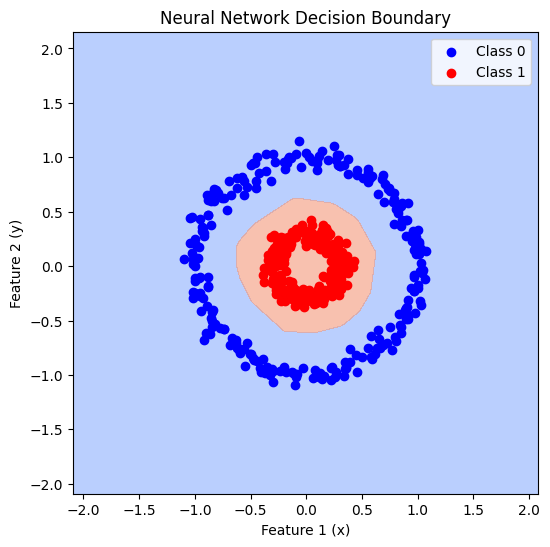

In [ ]:
# Train a neural network classifier on the original data
model = Sequential()
model.add(Input(shape=(2,)))  # Define the input shape
model.add(Dense(10, activation='relu'))
model.add(Dense(10, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Fit the model
model.fit(X, y, epochs=50, verbose=0)

# Predict and plot decision boundary for the neural network
xx, yy = np.meshgrid(np.linspace(X[:, 0].min() - 1, X[:, 0].max() + 1, 100),
                     np.linspace(X[:, 1].min() - 1, X[:, 1].max() + 1, 100))
grid = np.c_[xx.ravel(), yy.ravel()]
Z = model.predict(grid).reshape(xx.shape)

# Plot decision boundary learned by the neural network
plt.figure(figsize=(6, 6))
plt.contourf(xx, yy, Z, levels=[0, 0.5, 1], cmap="coolwarm", alpha=0.6)
plt.scatter(X[y == 0][:, 0], X[y == 0][:, 1], color='blue', label="Class 0")
plt.scatter(X[y == 1][:, 0], X[y == 1][:, 1], color='red', label="Class 1")
plt.title("Neural Network Decision Boundary")
plt.xlabel("Feature 1 (x)")
plt.ylabel("Feature 2 (y)")
plt.legend()
plt.show()

## Understanding Non-linear Regression

In many real-world applications, we are often faced with regression problems where the relationship between the input and the output is non-linear. A neural network can learn to approximate this complex mapping. In this section, we will generate synthetic non-linear data and train a neural network to model this relationship.

We’ll start by visualizing the non-linear dataset and then train the neural network to fit this data.

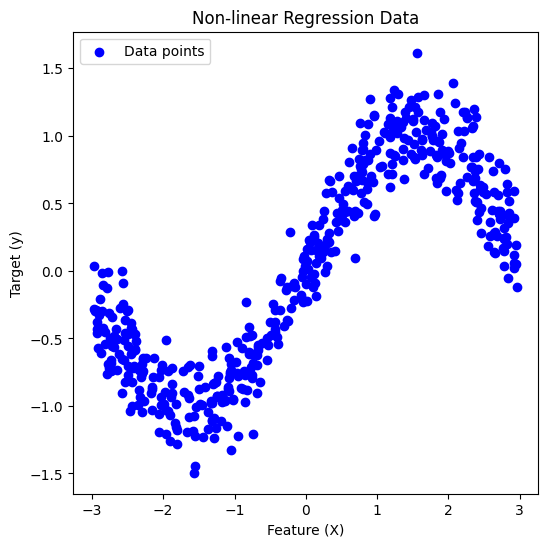

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from keras import Sequential  # For Sequential models
from keras.layers import Dense  # For Dense layers


# Create a synthetic non-linear regression dataset
np.random.seed(42)
X = np.random.uniform(-3, 3, 500).reshape(-1, 1)
y = np.sin(X) + 0.2 * np.random.normal(size=X.shape)

# Plot the non-linear data
plt.figure(figsize=(6, 6))
plt.scatter(X, y, color='blue', label="Data points")
plt.title("Non-linear Regression Data")
plt.xlabel("Feature (X)")
plt.ylabel("Target (y)")
plt.legend()
plt.show()



1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


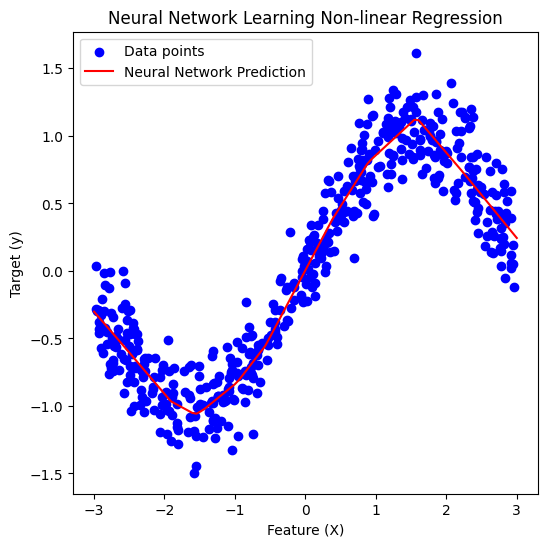

In [ ]:
# Build a simple neural network model to learn the non-linear regression
model = Sequential()
model.add(Dense(10, activation='relu', input_dim=1))
model.add(Dense(10, activation='relu'))
model.add(Dense(1))  # Output layer for regression
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the neural network
model.fit(X, y, epochs=200, verbose=0)

# Predict using the neural network
X_test = np.linspace(-3, 3, 100).reshape(-1, 1)
y_pred = model.predict(X_test)

# Plot the neural network predictions alongside the original data
plt.figure(figsize=(6, 6))
plt.scatter(X, y, color='blue', label="Data points")
plt.plot(X_test, y_pred, color='red', label="Neural Network Prediction")
plt.title("Neural Network Learning Non-linear Regression")
plt.xlabel("Feature (X)")
plt.ylabel("Target (y)")
plt.legend()
plt.show()


## Neural Networks: Key Concepts and Terminology

To successfully train neural networks and apply them to tasks like brain-computer interface (BCI) signal decoding, it’s essential to understand some core concepts that underlie how neural networks learn. These concepts include optimizers, loss functions, and learning rates. Below, we’ll break down each of these terms.

### What is a Neural Network?

At its core, a neural network is a computational model inspired by the structure of the brain. It consists of layers of neurons (or units) that are connected to each other. Each neuron processes inputs by applying weights and biases, passing the results through an activation function, and sending the processed information to the next layer.

The goal of training a neural network is to adjust these weights and biases so that the network can accurately predict the output given new inputs.

### Optimizer: Guiding the Learning Process

An optimizer is an algorithm used to update the weights of the network based on the error produced by the model. It is essentially responsible for minimizing the error (or loss) during training. The optimizer calculates the gradient (direction and magnitude) that tells the network how to adjust its weights to improve performance on the task.

The most commonly used optimizer in deep learning is Adam (Adaptive Moment Estimation). It combines the advantages of two other methods, Momentum and RMSProp, and helps to converge faster to the optimal weights.

Key Optimizers:
*   Stochastic Gradient Descent (SGD): Updates weights based on a single sample at a time, which can make it noisy but potentially faster.
*   Adam: A more advanced optimizer that adapts the learning rate and works well in most situations. It’s popular due to its ability to handle sparse gradients and noisy data.




In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib import rc
rc('animation', html='jshtml')

# Define a sharper custom non-convex loss function
def custom_loss_function(x):
    return 0.1 * x**2 + np.sin(3 * x) + 0.5 * np.sin(5 * x)

# Gradient of the custom loss function
def gradient(x):
    return 0.2 * x + 3 * np.cos(3 * x) + 2.5 * np.cos(5 * x)

# SGD without momentum
def sgd_no_momentum(start, lr, iterations):
    x = start
    path = [x]
    for _ in range(iterations):
        grad = gradient(x)
        x -= lr * grad
        path.append(x)
    return np.array(path)

# SGD with momentum
def sgd_with_momentum(start, lr, momentum, iterations):
    x = start
    v = 0  # velocity term for momentum
    path = [x]
    for _ in range(iterations):
        grad = gradient(x)
        v = momentum * v - lr * grad
        x += v
        path.append(x)
    return np.array(path)

# Parameters
learning_rate = 0.08
momentum = 0.95
iterations = 100
start_point = 5.0

# Paths for both methods
path_no_momentum = sgd_no_momentum(start_point, learning_rate, iterations)
path_with_momentum = sgd_with_momentum(start_point, learning_rate, momentum, iterations)

# Generate x values for plotting the loss surface
x_vals = np.linspace(-6, 6, 400)
y_vals = custom_loss_function(x_vals)

# Set up the figure and subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot loss function on both subplots
ax1.plot(x_vals, y_vals, label='Loss Function', color='gray')
ax1.set_title('SGD (No Momentum)')
ax1.set_xlabel('X')
ax1.set_ylabel('Loss')
ax1.grid(True)

ax2.plot(x_vals, y_vals, label='Loss Function', color='gray')
ax2.set_title('SGD (With Momentum)')
ax2.set_xlabel('X')
ax2.set_ylabel('Loss')
ax2.grid(True)

# Initialize scatter plots for the optimization paths
scatter_no_momentum_past, = ax1.plot([], [], 'bo', label='SGD Path (No Momentum)', alpha=0.4)
scatter_no_momentum_current, = ax1.plot([], [], 'bo', label='SGD Current Point (No Momentum)', markersize=8)

scatter_with_momentum_past, = ax2.plot([], [], 'ro', label='SGD Path (With Momentum)', alpha=0.4)
scatter_with_momentum_current, = ax2.plot([], [], 'ro', label='SGD Current Point (With Momentum)', markersize=8)

# Initialize function to update animation
def update(frame):
    # Update the scatter plot for SGD without momentum (past points with alpha=0.4)
    scatter_no_momentum_past.set_data(path_no_momentum[:frame], custom_loss_function(path_no_momentum[:frame]))
    # Set the current point with full opacity
    scatter_no_momentum_current.set_data(path_no_momentum[frame:frame+1], custom_loss_function(path_no_momentum[frame:frame+1]))

    # Update the scatter plot for SGD with momentum (past points with alpha=0.4)
    scatter_with_momentum_past.set_data(path_with_momentum[:frame], custom_loss_function(path_with_momentum[:frame]))
    # Set the current point with full opacity
    scatter_with_momentum_current.set_data(path_with_momentum[frame:frame+1], custom_loss_function(path_with_momentum[frame:frame+1]))

    return scatter_no_momentum_past, scatter_no_momentum_current, scatter_with_momentum_past, scatter_with_momentum_current

# Create animation
ani = FuncAnimation(fig, update, frames=range(1, iterations + 1), interval=200, blit=True)
plt.close()

# Render the animation inline in the notebook
HTML(ani.to_jshtml())


### Loss Function: Measuring Model Performance

The loss function quantifies how well or poorly the neural network is performing on a given task. It calculates the difference between the predicted output and the actual target output (ground truth). During training, the goal is to minimize this loss.

The type of loss function you choose depends on the task you are solving:
* **Mean Squared Error (MSE)**: Often used for regression tasks, where the goal is to predict continuous values (e.g., predicting brain wave frequency). MSE is defined as:
$$
L_{MSE} = \frac{1}{N} \sum_{i=1}^{N} \left( y_i - \hat{y_i} \right)^2
$$
where:
    - $N$ is the number of samples.
    - $y_i$ is the true target value for the $i$-th sample.
    - $\hat{y_i}$ is the predicted value for the $i$-th sample.
    
* **Binary Cross-Entropy**: Commonly used for classification tasks with two possible outcomes (e.g., predicting 0 or 1).
The Binary Cross-Entropy (BCE) loss is defined as:
$$
L_{BCE} = - \frac{1}{N} \sum_{i=1}^{N} \left[ y_i \log(p_i) + (1 - y_i) \log(1 - p_i) \right]
$$
where:
    - $N$ is the number of samples.
    - $y_i$ is the true label for the $i$-th sample (0 or 1).
    - $p_i$ is the predicted probability (the output of the model) for the $i$-th sample.


* **Categorical Cross-Entropy (for multi-class classification)**: Used when predicting multiple classes (e.g., classifying images into 10 categories like digits). Categorical Cross-Entropy (CE) is defined as:
$$
L_{CE} = - \frac{1}{N} \sum_{i=1}^{N} \sum_{c=1}^{C} y_{i,c} \log(p_{i,c})
$$
where:
    - $N$ is the number of samples.
    - $C$ is the number of classes.
    - $y_{i,c}$ is a binary indicator (0 or 1) if class label $c$ is the correct classification for sample $i$.
    - $p_{i,c}$ is the predicted probability that sample $i$ belongs to class $c$.

The smaller the loss, the better the model is performing. The optimizer uses the loss to adjust the weights and biases in the network.


### Learning Rate: Controlling the Speed of Learning

The learning rate is a hyperparameter that determines the size of the steps the optimizer takes when adjusting the weights. If the learning rate is too large, the model might "jump" over the optimal weights, leading to poor performance. If it's too small, the model will learn very slowly and may take too long to converge.
Key Considerations:

* High Learning Rate: Can lead to rapid convergence but might overshoot the optimal solution.
* Low Learning Rate: Can ensure more precise convergence but might take much longer to reach optimal performance.

In practice, you may want to try different learning rates or use adaptive learning rate techniques like in the Adam optimizer.



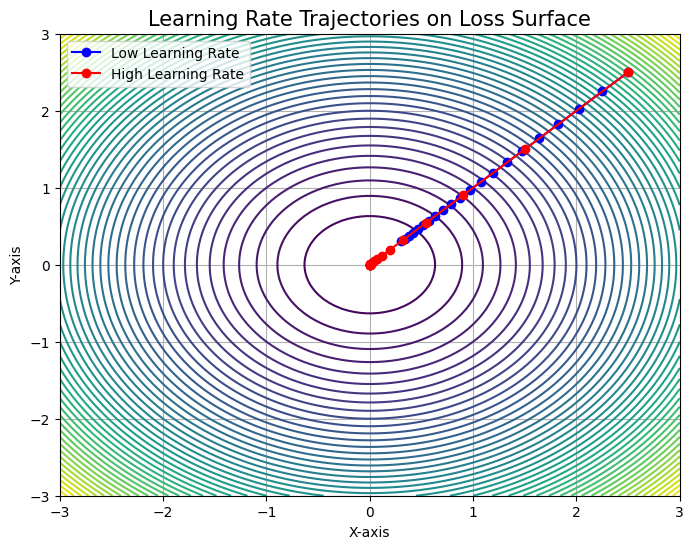

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

# Loss function
def loss_function(x, y):
    return x**2 + y**2

# Meshgrid for the loss surface
x_vals = np.linspace(-3, 3, 100)
y_vals = np.linspace(-3, 3, 100)
X, Y = np.meshgrid(x_vals, y_vals)
Z = loss_function(X, Y)

# Trajectories for different learning rates
low_lr_trajectory = [(2.5, 2.5)]  # Low learning rate starting point
high_lr_trajectory = [(2.5, 2.5)]  # High learning rate starting point

for _ in range(20):
    # Simulate Low Learning Rate (step size = 0.05)
    x_low_lr, y_low_lr = low_lr_trajectory[-1]
    grad_x_low_lr = 2 * x_low_lr
    grad_y_low_lr = 2 * y_low_lr
    low_lr_trajectory.append((x_low_lr - 0.05 * grad_x_low_lr, y_low_lr - 0.05 * grad_y_low_lr))

    # Simulate High Learning Rate (step size = 0.2)
    x_high_lr, y_high_lr = high_lr_trajectory[-1]
    grad_x_high_lr = 2 * x_high_lr
    grad_y_high_lr = 2 * y_high_lr
    high_lr_trajectory.append((x_high_lr - 0.2 * grad_x_high_lr, y_high_lr - 0.2 * grad_y_high_lr))

# Convert trajectory lists to numpy arrays for plotting
low_lr_trajectory = np.array(low_lr_trajectory)
high_lr_trajectory = np.array(high_lr_trajectory)

# Plot the loss surface
plt.figure(figsize=(8, 6))
plt.contour(X, Y, Z, levels=50, cmap='viridis')
plt.plot(low_lr_trajectory[:, 0], low_lr_trajectory[:, 1], label='Low Learning Rate', color='blue', marker='o')
plt.plot(high_lr_trajectory[:, 0], high_lr_trajectory[:, 1], label='High Learning Rate', color='red', marker='o')

# Labels and title
plt.title("Learning Rate Trajectories on Loss Surface", fontsize=15)
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend()
plt.grid(True)
plt.show()


### How These Concepts Come Together

Now that we understand the essential components of training a neural network, let's see how they come together in our experiments:

* The optimizer (e.g., Adam) helps adjust the weights during training.
* The loss function (e.g., binary cross-entropy or mean squared error) measures how well the network is performing.
* The learning rate controls how fast the model learns.
* Epochs and batches control how the model iterates over the data.
* Activation functions help the network learn complex, non-linear relationships.

Understanding these concepts is crucial when training models to decode neural signals for applications like brain-computer interfaces.

**Important caveat**: we haven't talked about this since it is outside the scope of this workshop, but you should be aware that, many times, a more complex model may not be the best solution, especially when we want to run it in real time:  interactions between the model output and the subject controlling it cause complex models to not work as well in these situations.

## Model Complexity and Generalization

When building machine learning models, choosing the right level of complexity is crucial. If the model is too simple (like a linear model for complex data), it may underfit, meaning it won't capture the underlying trend in the data. On the other hand, if the model is too complex (like a high-degree polynomial), it may overfit, meaning it will fit the training data too well, including the noise, which reduces its performance on unseen data.

To evaluate how well a model generalizes, we divide the data into three sets:

* **Training set:** Used to train the model.
* **Validation set:** Used to tune the model and prevent overfitting.
* **Test set:** Used to evaluate the final performance of the model on unseen data.

In this example, we will generate 5th-degree polynomial data and fit it with a 1st-degree polynomial (underfitting) and a 20th-degree polynomial (overfitting).

### Step 1: Generate the Data

We will generate a dataset using a degree 5 polynomial, and split it into training, validation, and test sets.





In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Generate 5th degree polynomial data with noise
np.random.seed(42)
X = np.linspace(-3, 3, 100).reshape(-1, 1)
y_true = 1*X**5 + 0.5*X**4 - 3*X**3 - 2*X**2 + 2*X # 5th degree polynomial
y = y_true + np.random.randn(100, 1) * 10 # 5th degree polynomial + noise
# Split the data into train, validation, and test sets (60% train, 20% val, 20% test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

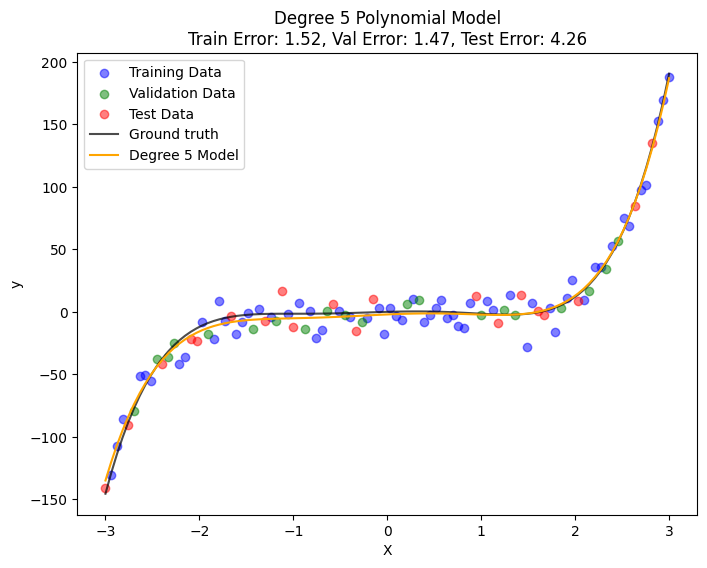

In [ ]:
# @title
# Function to fit polynomial models and plot the results for degree 1, 5, and 20
def plot_polynomial_fit(degree, X_train, y_train, X_val, y_val, X_test, y_test):
    poly = PolynomialFeatures(degree=degree)
    X_train_poly = poly.fit_transform(X_train)
    X_val_poly = poly.transform(X_val)
    X_test_poly = poly.transform(X_test)

    # Fit the model
    model = LinearRegression()
    model.fit(X_train_poly, y_train)

    # Make predictions
    y_train_pred = model.predict(X_train_poly)
    y_val_pred = model.predict(X_val_poly)
    y_test_pred = model.predict(X_test_poly)

    # Calculate MSE for train, validation, and test sets
    train_error = mean_squared_error(y_train, y_train_pred)/len(y_train)
    val_error = mean_squared_error(y_val, y_val_pred)/len(y_val)
    test_error = mean_squared_error(y_test, y_test_pred)/len(y_test)

    # Plot the results
    plt.figure(figsize=(8, 6))
    plt.scatter(X_train, y_train, color='blue', label='Training Data', alpha=0.5)
    plt.scatter(X_val, y_val, color='green', label='Validation Data', alpha=0.5)
    plt.scatter(X_test, y_test, color='red', label='Test Data', alpha=0.5)
    plt.plot(X, y_true, color='k', label='Ground truth', alpha=0.7)
    plt.plot(np.linspace(-3, 3, 100).reshape(-1, 1), model.predict(poly.transform(np.linspace(-3, 3, 100).reshape(-1, 1))), label=f'Degree {degree} Model', color='orange')
    plt.title(f'Degree {degree} Polynomial Model\nTrain Error: {train_error:.2f}, Val Error: {val_error:.2f}, Test Error: {test_error:.2f}')
    plt.xlabel('X')
    plt.ylabel('y')
    plt.legend()
    plt.show()


plot_polynomial_fit(5, X_train, y_train, X_val, y_val, X_test, y_test)



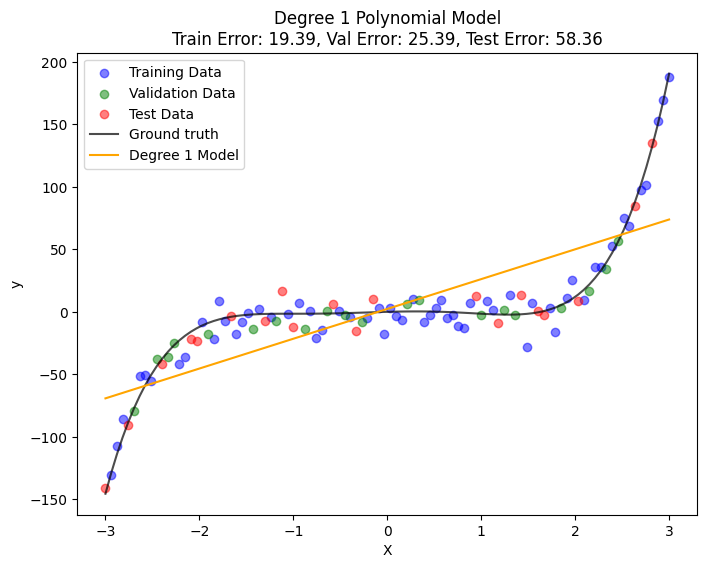

In [ ]:
# Plot for degree 1
plot_polynomial_fit(1, X_train, y_train, X_val, y_val, X_test, y_test)

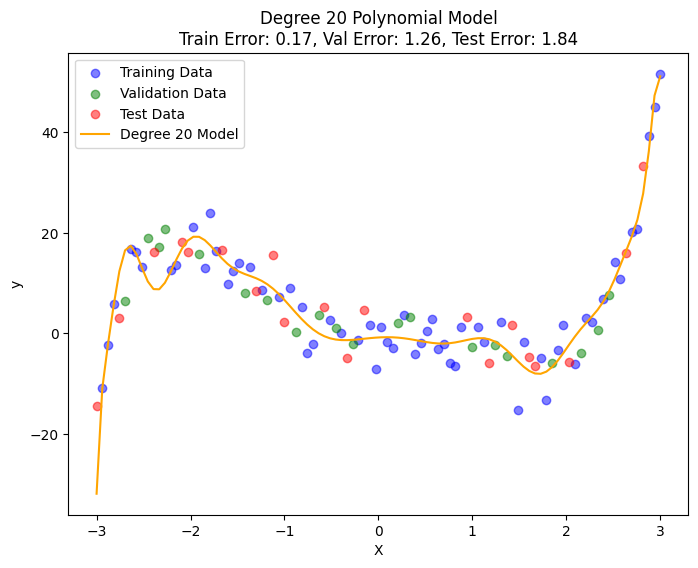

In [ ]:
plot_polynomial_fit(20, X_train, y_train, X_val, y_val, X_test, y_test)

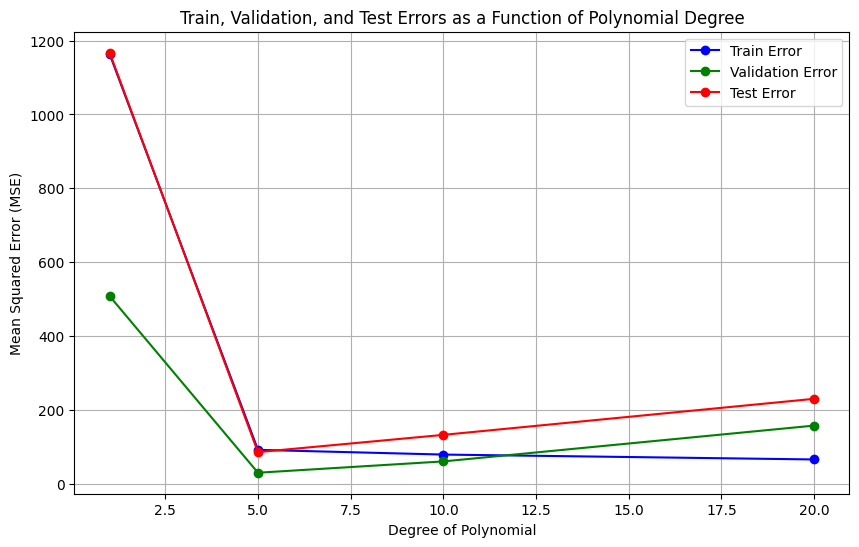

In [ ]:
# Function to fit polynomial models of varying degrees and calculate errors
degrees = [1,5,10,20]
train_errors = []
val_errors = []
test_errors = []

for degree in degrees:
    poly = PolynomialFeatures(degree=degree)
    X_train_poly = poly.fit_transform(X_train)
    X_val_poly = poly.transform(X_val)
    X_test_poly = poly.transform(X_test)

    # Fit the model
    model = LinearRegression()
    model.fit(X_train_poly, y_train)

    # Make predictions
    y_train_pred = model.predict(X_train_poly)
    y_val_pred = model.predict(X_val_poly)
    y_test_pred = model.predict(X_test_poly)

    # Calculate MSE for train, validation, and test sets
    train_error = mean_squared_error(y_train, y_train_pred)
    val_error = mean_squared_error(y_val, y_val_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Store the errors
    train_errors.append(train_error)
    val_errors.append(val_error)
    test_errors.append(test_error)

# Plot the errors as a function of polynomial degree
plt.figure(figsize=(10, 6))
plt.plot(degrees, train_errors, label='Train Error', color='blue', marker='o')
plt.plot(degrees, val_errors, label='Validation Error', color='green', marker='o')
plt.plot(degrees, test_errors, label='Test Error', color='red', marker='o')
plt.xlabel('Degree of Polynomial')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('Train, Validation, and Test Errors as a Function of Polynomial Degree')
plt.legend()
plt.grid(True)
plt.show()


### Key Takeaways:

- **Underfitting**: A degree-1 polynomial model is too simple and underfits the data, resulting in high errors on all datasets.
- **Good Fit**: A degree-5 polynomial model matches the underlying data well, as it was generated from a 5th-degree function.
- **Overfitting**: A degree-20 polynomial model fits the training data too closely, including noise, and performs poorly on validation and test sets.
- **Importance of Validation and Test Sets**: The validation and test errors help us determine how well the model generalizes to unseen data. If the validation and test errors are significantly higher than the training error, the model is overfitting.
